# Diffusion models: Sampling and conditional sampling of a pretrained DDPM model

This notebook is based on the [github repository](https://github.com/DPS2022/diffusion-posterior-sampling.git) of

*Diffusion Posterior Sampling for General Noisy Inverse Problems*, <br/>
by Hyungjin Chung, Jeongsol Kim, Michael T. Mccann, Marc L. Klasky, Jong Chul Ye, <br/>
ICLR 2023, https://arxiv.org/abs/2209.14687

We use the U-net trained by the authors on the FFHQ datasets (using 49k images, ```01000.png``` to ```49999.png```).

It is a DDPM model based on

* Diffusion Models Beat GANs on Image Synthesis, Prafulla Dhariwal, Alex Nichol, NeurIPS 2021, https://arxiv.org/abs/2105.05233
[github](https://github.com/openai/guided-diffusion/)

* Denoising Diffusion Probabilistic Models, Jonathan Ho, Ajay Jain, Pieter Abbeel, NeurIPS 2020, https://arxiv.org/abs/2006.11239
[projectpage](https://hojonathanho.github.io/diffusion/)

**Notebook author:**
* Bruno Galerne: www.idpoisson.fr/galerne / https://github.com/bgalerne


$\newcommand{\bx}{\mathbf{x}} % bold x$
$\newcommand{\bz}{\mathbf{z}} % bold z$


# Download files:

In [ ]:
!git clone https://github.com/DPS2022/diffusion-posterior-sampling.git
!cp -r diffusion-posterior-sampling/guided_diffusion guided_diffusion
!wget -nc -O ffhq256-1k-validation.zip 'https://www.dropbox.com/scl/fi/pppstbdsf0em6o0qscruc/ffhq256-1k-validation.zip?rlkey=xl7nwv2nxb6yvsirr3wad77hm'
!unzip -nq ffhq256-1k-validation.zip
!wget -nc -O ffhq_10m.pt 'https://www.dropbox.com/scl/fi/pq72vxzxcbygieq5z4gvf/ffhq_10m.pt?rlkey=5sxdj6r4o9f7b7bbp5fxg2f5r'

Cloning into 'diffusion-posterior-sampling'...
remote: Enumerating objects: 82, done.
remote: Counting objects: 100% (38/38), done.
remote: Compressing objects: 100% (18/18), done.
remote: Total 82 (delta 25), reused 20 (delta 20), pack-reused 44
Receiving objects: 100% (82/82), 16.19 MiB | 26.56 MiB/s, done.
Resolving deltas: 100% (31/31), done.
--2024-03-22 14:44:06--  https://www.dropbox.com/scl/fi/pppstbdsf0em6o0qscruc/ffhq256-1k-validation.zip?rlkey=xl7nwv2nxb6yvsirr3wad77hm
Resolving www.dropbox.com (www.dropbox.com)... 162.125.3.18, 2620:100:6018:18::a27d:312
Connecting to www.dropbox.com (www.dropbox.com)|162.125.3.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://uc93a722f0b49b068b82f6608a35.dl.dropboxusercontent.com/cd/0/inline/CPmyhDWjLNs9vcyDGv1yNLVf5Pt_GRcz9rTrttKEvEzJGfNB0tZmnGYrtNFWvGRnRpHHPZ80Hn98-1t1JlZT1Ko4SWyu-efe3W7Gx_nVrRkH7-GornSl_aVBl8STTngyb68/file# [following]
--2024-03-22 14:44:11--  https://uc93a722f0b49b068b82f6608a35.

In [ ]:
import torch
import torchvision
import numpy as np

import matplotlib.pyplot as plt

from PIL import Image
from tqdm import tqdm
from guided_diffusion.unet import create_model

from tqdm.notebook import tqdm, trange

device = "cuda:0" if torch.cuda.is_available() else "cpu"
print("Device:", device)

Device: cuda:0


# Display functions
We will work with PyTorch images with color values in $[-1,1]$ and the usual additional batch dimension.
Images will have size 1x3x256x256 in PyTorch.

Image 00495


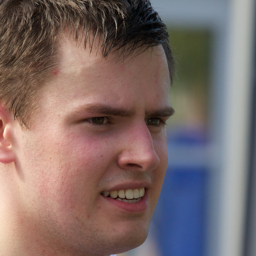

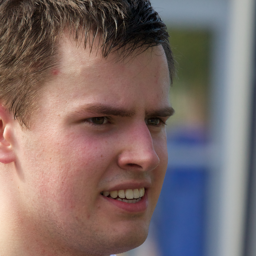

In [ ]:
def pilimg_to_tensor(pil_img):
  t = torchvision.transforms.ToTensor()(pil_img)
  t = 2*t-1 # [0,1]->[-1,1]
  t = t.unsqueeze(0)
  t = t.to(device)
  return(t)

def display_as_pilimg(t):
  t = 0.5+0.5*t.to('cpu')
  t = t.squeeze()
  t = t.clamp(0.,1.)
  pil_img = torchvision.transforms.ToPILImage()(t)
  display(pil_img)
  return(pil_img)

idx = np.random.randint(1000)
print('Image', str(idx).zfill(5))
img_pil = Image.open('ffhq256-1k-validation/'+str(idx).zfill(5)+'.png')
display(img_pil)
display_as_pilimg(pilimg_to_tensor(img_pil));


# Load DDPM Unet

In [ ]:
# Load model
model_config = {'image_size': 256,
                'num_channels': 128,
                'num_res_blocks': 1,
                'channel_mult': '',
                'learn_sigma': True,
                'class_cond': False,
                'use_checkpoint': False,
                'attention_resolutions': 16,
                'num_heads': 4,
                'num_head_channels': 64,
                'num_heads_upsample': -1,
                'use_scale_shift_norm': True,
                'dropout': 0.0,
                'resblock_updown': True,
                'use_fp16': False,
                'use_new_attention_order': False,
                'model_path': 'ffhq_10m.pt'}
model = create_model(**model_config)
model = model.to(device)
# use in eval mode:
model.eval();


In [ ]:
model.forward

<bound method UNetModel.forward of UNetModel(
  (time_embed): Sequential(
    (0): Linear(in_features=128, out_features=512, bias=True)
    (1): SiLU()
    (2): Linear(in_features=512, out_features=512, bias=True)
  )
  (input_blocks): ModuleList(
    (0): TimestepEmbedSequential(
      (0): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
    (1): TimestepEmbedSequential(
      (0): ResBlock(
        (in_layers): Sequential(
          (0): GroupNorm32(32, 128, eps=1e-05, affine=True)
          (1): SiLU()
          (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
        (h_upd): Identity()
        (x_upd): Identity()
        (emb_layers): Sequential(
          (0): SiLU()
          (1): Linear(in_features=512, out_features=256, bias=True)
        )
        (out_layers): Sequential(
          (0): GroupNorm32(32, 128, eps=1e-05, affine=True)
          (1): SiLU()
          (2): Dropout(p=0.0, inplace=False)
          (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
        (skip_connection): Identity()
      )
    )
    (2): TimestepEmbedSequential(
      (0): ResBlock(
        (in_layers): Sequential(
          (0): GroupNorm32(32, 128, eps=1e-05, affine=True)
          (1): SiLU()
          (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
        (h_upd): Downsample(
          (op): AvgPool2d(kernel_size=2, stride=2, padding=0)
        )
        (x_upd): Downsample(
          (op): AvgPool2d(kernel_size=2, stride=2, padding=0)
        )
        (emb_layers): Sequential(
          (0): SiLU()
          (1): Linear(in_features=512, out_features=256, bias=True)
        )
        (out_layers): Sequential(
          (0): GroupNorm32(32, 128, eps=1e-05, affine=True)
          (1): SiLU()
          (2): Dropout(p=0.0, inplace=False)
          (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
        (skip_connection): Identity()
      )
    )
    (3): TimestepEmbedSequential(
      (0): ResBlock(
        (in_layers): Sequential(
          (0): GroupNorm32(32, 128, eps=1e-05, affine=True)
          (1): SiLU()
          (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
        (h_upd): Identity()
        (x_upd): Identity()
        (emb_layers): Sequential(
          (0): SiLU()
          (1): Linear(in_features=512, out_features=256, bias=True)
        )
        (out_layers): Sequential(
          (0): GroupNorm32(32, 128, eps=1e-05, affine=True)
          (1): SiLU()
          (2): Dropout(p=0.0, inplace=False)
          (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
        (skip_connection): Identity()
      )
    )
    (4): TimestepEmbedSequential(
      (0): ResBlock(
        (in_layers): Sequential(
          (0): GroupNorm32(32, 128, eps=1e-05, affine=True)
          (1): SiLU()
          (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
        (h_upd): Downsample(
          (op): AvgPool2d(kernel_size=2, stride=2, padding=0)
        )
        (x_upd): Downsample(
          (op): AvgPool2d(kernel_size=2, stride=2, padding=0)
        )
        (emb_layers): Sequential(
          (0): SiLU()
          (1): Linear(in_features=512, out_features=256, bias=True)
        )
        (out_layers): Sequential(
          (0): GroupNorm32(32, 128, eps=1e-05, affine=True)
          (1): SiLU()
          (2): Dropout(p=0.0, inplace=False)
          (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
        (skip_connection): Identity()
      )
    )
    (5): TimestepEmbedSequential(
      (0): ResBlock(
        (in_layers): Sequential(
          (0): GroupNorm32(32, 128, eps=1e-05, affine=True)
          (1): SiLU()
          (2): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
        (h_upd): Identity()
        (x_upd):

# DDPM class

The DDPM class defined below will be used to sample the DDPM model.

The Unet ```model``` estimates the residual noise $\varepsilon_t(\bx_t, t)$ from a noisy image $(\bx_t, t)$.

The method ```get_eps_from_model(self, x, t)``` computes $\varepsilon_t(\bx_t, t)$.

The method ```predict_xstart_from_eps(self, x, eps, t)``` computes

$$
\hat{\bx_0}(\bx_t) = \frac{1}{\sqrt{\bar{\alpha}_t}} \bx_t
- \sqrt{\frac{1}{\bar{\alpha}_t}-1} \;  \varepsilon_t(\bx_t, t).
$$

In the following exercises, you will have to complete methods `sample` and `posterior_sampling` defined in this class.

Remark that several variables are already precomputed in the class:
* `self.num_diffusion_timesteps` : $T$
* `self.reversed_time_steps` : backward $t$ range:  $\{T, T-1, \ldots, 1\}$
* `self.betas` : $(\beta_t)_{1 \leq t \leq T}$
* `self.alphas` : $(\alpha_t)_{1 \leq t \leq T}$
* `self.alphas_cumprod` : $(\bar{\alpha}_t)_{1 \leq t \leq T}$
* `self.alphas_cumprod_prev` : $(\bar{\alpha}_{t-1})_{1 \leq t \leq T}$


In [ ]:
class DDPM:
  def __init__(self, model=model):
    self.num_diffusion_timesteps = 500
    self.reversed_time_steps = np.arange(self.num_diffusion_timesteps)[::-1]
    beta_start = 0.0001
    beta_end = 0.02
    self.betas = np.linspace(beta_start, beta_end, self.num_diffusion_timesteps,
                              dtype=np.float64)
    self.alphas = 1.0 - self.betas
    self.alphas_cumprod = np.cumprod(self.alphas, axis=0)
    self.alphas_cumprod_prev = np.append(1.0, self.alphas_cumprod[:-1])
    self.model = model
    self.imgshape = (1,3,256,256)


  def get_eps_from_model(self, x, t):
    # the model outputs:
    # - an estimation of the noise eps (chanels 0 to 2)
    # - learnt variances for the posterior  (chanels 3 to 5)
    # (see Improved Denoising Diffusion Probabilistic Models
    # by Alex Nichol, Prafulla Dhariwal
    # for the parameterization)
    # We discard the second part of the output for this practice session.
    model_output = self.model(x, torch.tensor(t, device=device).unsqueeze(0))
    model_output = model_output[:,:3,:,:]
    return(model_output)

  def predict_xstart_from_eps(self, x, eps, t):
    x_start = (
        np.sqrt(1.0 / self.alphas_cumprod[t])* x
        - np.sqrt(1.0 / self.alphas_cumprod[t] - 1) * eps
    )
    x_start = x_start.clamp(-1.,1.)
    return(x_start)

  def sample(self, show_steps=True):
    with torch.no_grad():  # avoid backprop wrt model parameters
      xt = torch.randn(self.imgshape,device=device)  # initialize x_t for t=T
      for i, t in enumerate(self.reversed_time_steps):
        if t > 1:
          z = torch.randn(self.imgshape, device=device)
        else:
          z = torch.zeros(self.imgshape, device=device)

        alpha_t = self.alphas[t]
        alpha_bar_t = self.alphas_cumprod[t]
        sigma_t = np.sqrt(self.betas[t])

        eps = self.get_eps_from_model(xt,t)

        xt = 1/np.sqrt(alpha_t) * (xt -  (1-alpha_t) / np.sqrt(1-alpha_bar_t) * eps ) + sigma_t * z

        xhat = self.predict_xstart_from_eps(xt, eps, t)

        if show_steps and t%100==0:
          print('Iteration :', t)
          pilimg = display_as_pilimg(torch.cat((xt, xhat), dim=3))

    return(xt)

  def posterior_sampling(self, linear_operator, y, x_true=None, show_steps=True, vis_y=None):

    # visualization image for the observation y:
    if vis_y==None:
      vis_y = y

    # initialize xt for t=T
    x = torch.randn(self.imgshape,device=device)
    x.requires_grad = True


    for t in tqdm(self.reversed_time_steps[1:]):
      alpha_t = self.alphas[t]
      alpha_bar_t = self.alphas_cumprod[t]
      alpha_bar_tm1 = self.alphas_cumprod_prev[t]

      beta_t = self.betas[t]
      sigma_t = np.sqrt(beta_t)

      z = torch.randn(self.imgshape, device=device)

      xhat = self.predict_xstart_from_eps(x, self.get_eps_from_model(x,t), t)

      x_prime = np.sqrt(alpha_t) * (1-alpha_bar_tm1) / (1-alpha_bar_t) * x
      x_prime += np.sqrt(alpha_bar_tm1)*beta_t / (1-alpha_bar_t)*xhat
      x_prime += sigma_t*z

      df_term = torch.sum((y-linear_operator(xhat))**2)
      grad = torch.autograd.grad(df_term, x)[0]
      zeta = 1 / torch.sqrt(df_term)

      x = x_prime - zeta * grad

      if show_steps and (t)%100==0:
        print('Iteration :', t)
        pilimg = display_as_pilimg(torch.cat((x, xhat, y, x_true), dim=3))

    return(x)


ddpm = DDPM()


# Exercise 1: Denoiser visualization
1. Take an image from FFHQ validation set and apply the forward model to it:
$$
\bx_{t+1} = \sqrt{\alpha_t} \bx_t + \sqrt{\beta_t} \bz_t
$$
Display $\bx_t$ and $\hat{\bx_0}(\bx_t)$ for 10 different levels.

2. Display the two curves of the PSNR$(\bx_t,\bx_0)$ and PSNR$(\hat{\bx_0}(\bx_t),\bx_0)$.


  0%|          | 0/1000 [00:00<?, ?it/s]

Iteration : 100


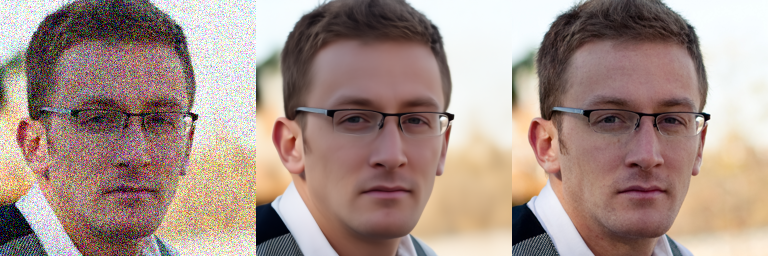

Iteration : 200


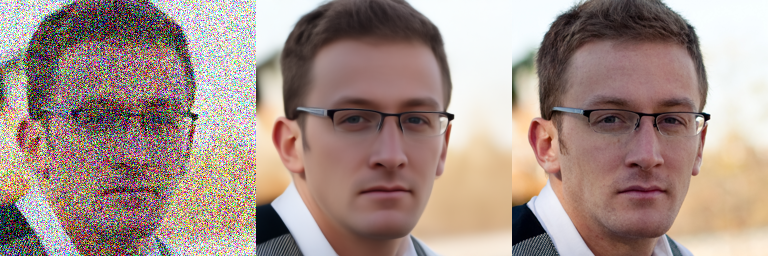

Iteration : 300


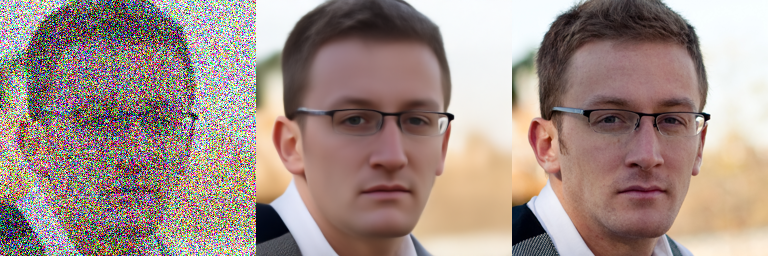

Iteration : 400


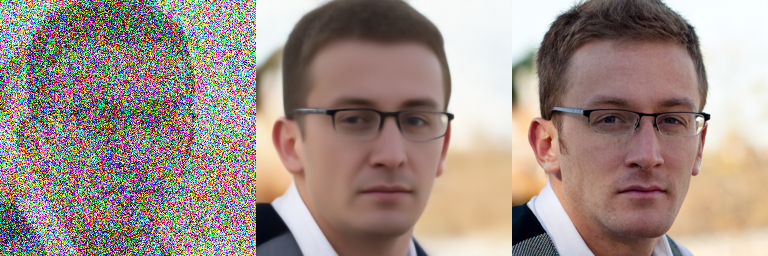

Iteration : 500


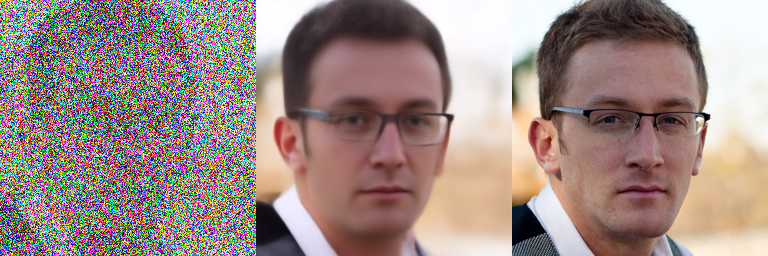

Iteration : 600


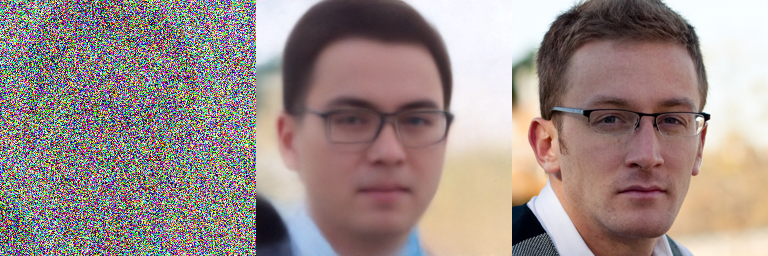

Iteration : 700


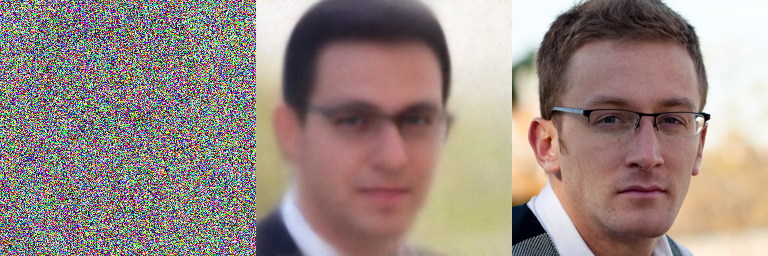

Iteration : 800


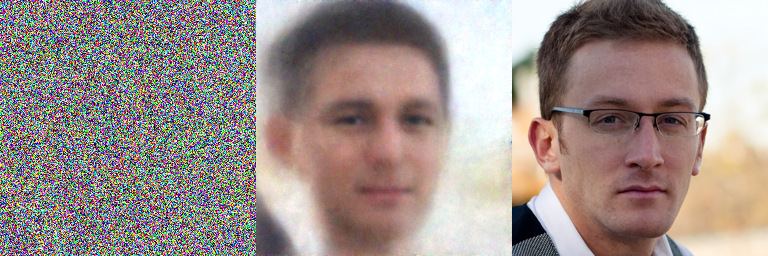

Iteration : 900


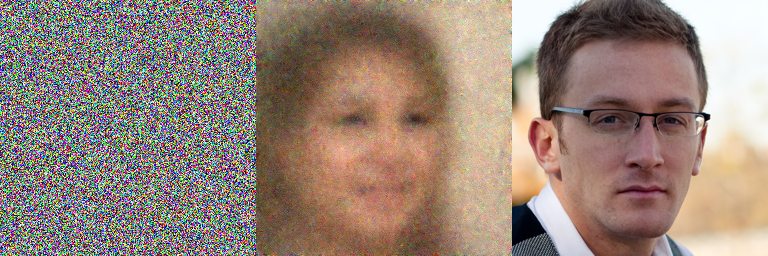

Iteration : 1000


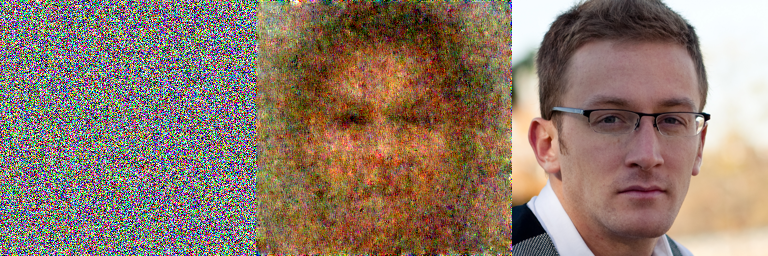

In [ ]:
#Exercise 1:
# Image 00462
idx = 462
img_pil = Image.open('ffhq256-1k-validation/'+str(idx).zfill(5)+'.png')
x0 = pilimg_to_tensor(img_pil)
psnr_noisy = []
psnr_denoised = []

def mypsnr(x,y):
  error = torch.mean((x-y)**2).item()
  psnr = 10*np.log10(2**2/error)
  return(psnr)

xt = x0.clone() # initialize xt for t=0
for t in trange(ddpm.num_diffusion_timesteps):

  with torch.no_grad(): # avoid backprop wrt model parameters

    # TODO

    zt = torch.randn(ddpm.imgshape, device=device)

    xt = np.sqrt(ddpm.alphas_cumprod[t])*x0 + np.sqrt(1-ddpm.alphas_cumprod[t])*zt
    eps = ddpm.get_eps_from_model(xt, t)
    xhat = ddpm.predict_xstart_from_eps(xt, eps, t)

    psnr_noisy += [mypsnr(xt, x0)]
    psnr_denoised += [mypsnr(xhat, x0)]

    if (t+1)%100==0:
      print('Iteration :', t+1)
      pilimg = display_as_pilimg(torch.cat((xt, xhat, x0), dim=3))


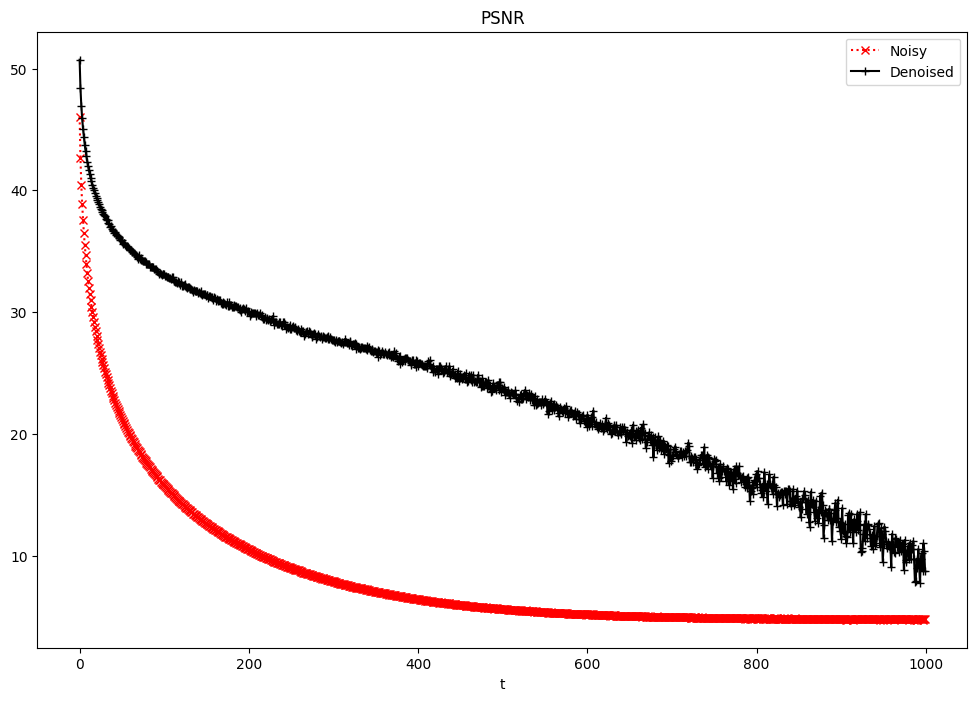

In [ ]:
# TODO Q2 plot

fig, ax = plt.subplots(figsize = (12,8))

t = list(range(ddpm.num_diffusion_timesteps))

plt.title('PSNR')

plt.plot(t, psnr_noisy, 'x:', color='r', label='Noisy')
plt.plot(t, psnr_denoised, '+-', color= 'k', label='Denoised')

plt.xlabel('t')
plt.legend()


<br/><br/><br/>

# Exercise 2: Sampling
1. Complete the method `sample` of the DDPM class.
Let us recall that the DDPM transition probability is given by
$$ p_\theta(\bx_{t-1}|\bx_{t}) = \mathcal{N}(\mu_\theta(\bx_{t}, t), \beta_t I_d) $$
where
$$
\mu_\theta(\bx_t, t) = \frac{1}{\sqrt{\alpha_t}} \left(\bx_t - \frac{\beta_t}{\sqrt{1-\bar{\alpha}_t}}\mathbf{\varepsilon}_\theta(\bx_t,t) \right).
$$

2. Add an option to the method ```sample``` to display both $\bx_t$ and $\hat{\bx_0}(\bx_t,t)$ every 100 iterations. Observe the evolution of the samples.


Iteration : 900


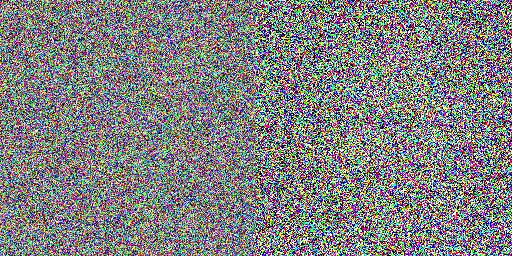

Iteration : 800


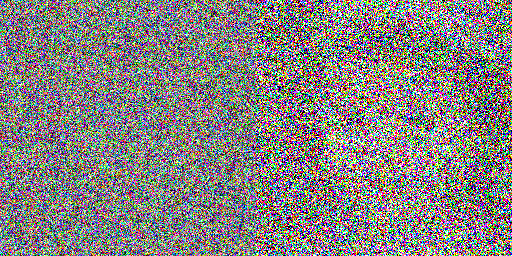

Iteration : 700


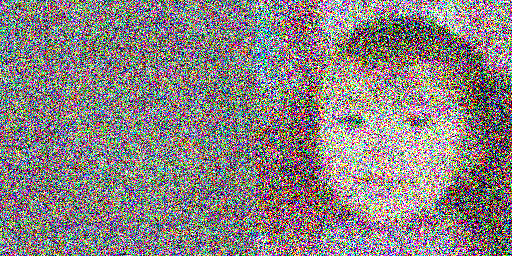

Iteration : 600


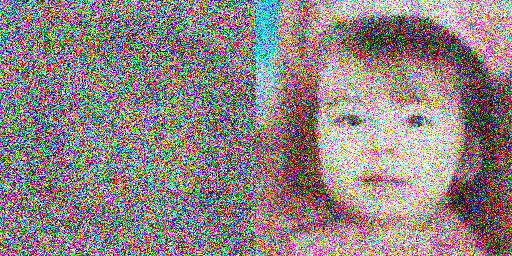

Iteration : 500


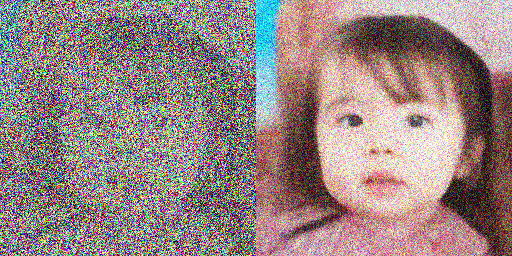

Iteration : 400


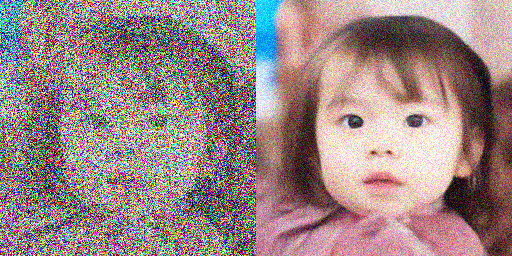

Iteration : 300


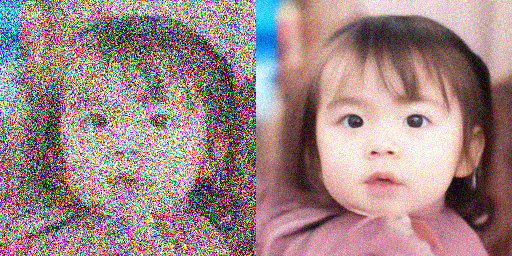

Iteration : 200


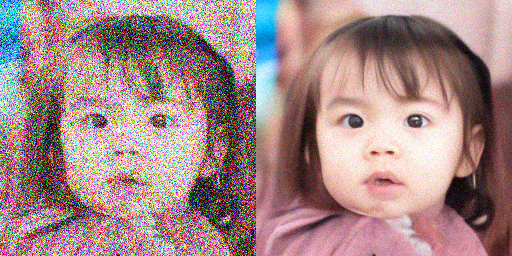

Iteration : 100


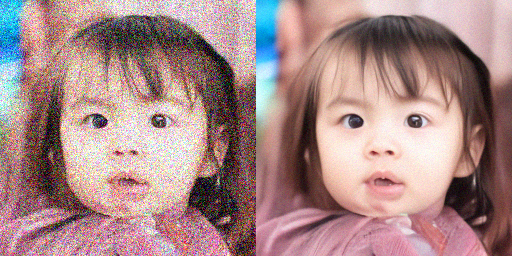

Iteration : 0


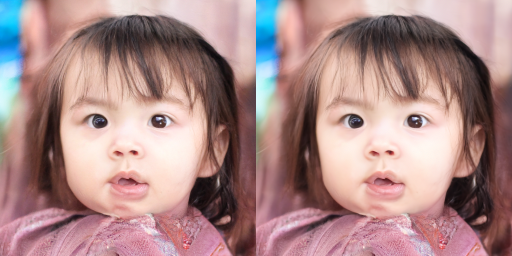

In [ ]:
sample = ddpm.sample()

<br/><br/><br/>

# Exercise 3: Conditional sampling for imaging inverse problems

We will perform conditional sampling for linear inverse problems based on

*Diffusion Posterior Sampling for General Noisy Inverse Problems*,<br/>
by Hyungjin Chung, Jeongsol Kim, Michael T. Mccann, Marc L. Klasky, Jong Chul Ye,<br/>
ICLR 2023, https://arxiv.org/abs/2209.14687

We restrict to linear measurements with Gaussian noise (eg inpainting, super-resolution, deblurring,...).

The algorithm is the following:
given
$\mathbf{y} = A \bx + \eta$ where $A$ is a linear operator and $\eta$ is some Gaussian additive noise, we want to approximately sample
$$
p_\theta(\bx_0| \mathbf{y} = A \bx_0 + \eta).
$$
This is performed by adding a correction term to the sampling procedure:


> Initialize $x_T$ as for unconditional sampling.
>
> For $t=T$ to $1$:
>  1. Predict $\hat{\bx_0}(\bx_t,t)$.
>  2. Compute the squared $\ell^2$ error $\|A\hat{\bx_0}(\bx_t,t) - \mathbf{y} \|^2$.
>  3. Define
>  $$ \bx_{t-1} = \mu_\theta(\bx_{t}, t) + \sqrt{\beta_t} \bz - \zeta_t \nabla_{\bx_t} \|A\hat{\bx_0}(\bx_t,t) - \mathbf{y} \|^2. $$
> where the scaling factor $\zeta_t$ has been experimentally fixed as $\|A\hat{\bx_0}(\bx_t,t) - \mathbf{y}\|^{-1}$.

Note that computing $\nabla_{\bx_t} \|A\hat{\bx_0}(\bx_t,t) - \mathbf{y} \|^2$ involves a backpropagation through the Unet so one can expect the conditional sampling to be twice as long as the sampling procedure.

**Questions:**

1. Add a method ```posterior_sampling```to the DDPM class with prototype <br/>
`posterior_sampling(self, linear_operator, y, x_true=None, show_steps=True, viz_y = None)` <br/>
that allows to display every 100 iterations the images $\bx_t$, $\hat{\bx_0}(\bx_t,t)$ as well as the observation $\mathbf{y}$, and the groundtruth image $\bx_0$ if given. <br/>
(We suppose that there is a natural way defined by tensor ```vis_y``` to visualize $\mathbf{y}$ as an image having the same size as $\mathbf{x}_t$. This is useful when $\mathbf{y}$ does not have the same size, e.g. for super-resolution...)
2. Test it with the inpainting example below.
3. Define the operator to solve a x4 super-resolution problem and test it on some portrait image.



In [ ]:
class DDPM:
  def __init__(self, model=model):
    self.num_diffusion_timesteps = 100
    self.reversed_time_steps = np.arange(self.num_diffusion_timesteps)[::-1]
    beta_start = 0.0001
    beta_end = 0.02
    self.betas = np.linspace(beta_start, beta_end, self.num_diffusion_timesteps,
                              dtype=np.float64)
    self.alphas = 1.0 - self.betas
    self.alphas_cumprod = np.cumprod(self.alphas, axis=0)
    self.alphas_cumprod_prev = np.append(1.0, self.alphas_cumprod[:-1])
    self.model = model
    self.imgshape = (1,3,256,256)


  def get_eps_from_model(self, x, t):
    # the model outputs:
    # - an estimation of the noise eps (chanels 0 to 2)
    # - learnt variances for the posterior  (chanels 3 to 5)
    # (see Improved Denoising Diffusion Probabilistic Models
    # by Alex Nichol, Prafulla Dhariwal
    # for the parameterization)
    # We discard the second part of the output for this practice session.
    model_output = self.model(x, torch.tensor(t, device=device).unsqueeze(0))
    model_output = model_output[:,:3,:,:]
    return(model_output)

  def predict_xstart_from_eps(self, x, eps, t):
    x_start = (
        np.sqrt(1.0 / self.alphas_cumprod[t])* x
        - np.sqrt(1.0 / self.alphas_cumprod[t] - 1) * eps
    )
    x_start = x_start.clamp(-1.,1.)
    return(x_start)

  def sample(self, show_steps=True):
    with torch.no_grad():  # avoid backprop wrt model parameters
      xt = torch.randn(self.imgshape,device=device)  # initialize x_t for t=T
      for i, t in enumerate(self.reversed_time_steps):
        if t > 1:
          z = torch.randn(self.imgshape, device=device)
        else:
          z = torch.zeros(self.imgshape, device=device)

        alpha_t = self.alphas[t]
        alpha_bar_t = self.alphas_cumprod[t]
        sigma_t = np.sqrt(self.betas[t])

        eps = self.get_eps_from_model(xt,t)

        xt = 1/np.sqrt(alpha_t) * (xt -  (1-alpha_t) / np.sqrt(1-alpha_bar_t) * eps ) + sigma_t * z

        xhat = self.predict_xstart_from_eps(xt, eps, t)

        if show_steps and t%100==0:
          print('Iteration :', t)
          pilimg = display_as_pilimg(torch.cat((xt, xhat), dim=3))

    return(xt)

  def posterior_sampling(self, linear_operator, y, x_true=None, show_steps=True, vis_y=None):

    # visualization image for the observation y:
    if vis_y==None:
      vis_y = y

    # initialize xt for t=T
    x = torch.randn(self.imgshape,device=device)
    x.requires_grad = True


    for t in tqdm(self.reversed_time_steps[1:]):
      alpha_t = self.alphas[t]
      alpha_bar_t = self.alphas_cumprod[t]
      alpha_bar_tm1 = self.alphas_cumprod_prev[t]

      beta_t = self.betas[t]
      sigma_t = np.sqrt(beta_t)

      z = torch.randn(self.imgshape, device=device)

      xhat = self.predict_xstart_from_eps(x, self.get_eps_from_model(x,t), t)

      x_prime = np.sqrt(alpha_t) * (1-alpha_bar_tm1) / (1-alpha_bar_t) * x
      x_prime += np.sqrt(alpha_bar_tm1)*beta_t / (1-alpha_bar_t)*xhat
      x_prime += sigma_t*z

      df_term = torch.sum((y-linear_operator(xhat))**2)
      grad = torch.autograd.grad(df_term, x)[0]
      zeta = 1 / torch.sqrt(df_term)

      x = x_prime - zeta * grad

      if show_steps and (t)%100==0:
        print('Iteration :', t)
        pilimg = display_as_pilimg(torch.cat((x, xhat, y, x_true), dim=3))
        #pilimg.save(f"inpainting_ddpm/{idx}_{self.num_diffusion_timesteps}_{t}.jpg")
    return(x)


ddpm = DDPM()


cuda:0
original image 00004.png


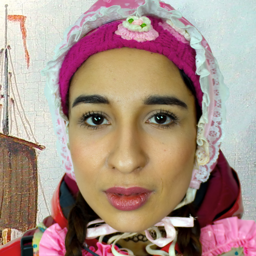

noisy measurement


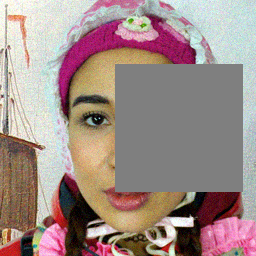

In [ ]:
h = 256
w = 256
hcrop, wcrop = h//2, w//2
corner_top, corner_left = h//4, int(0.45*w)
mask = torch.ones(ddpm.imgshape, device=device)
mask[:,:,corner_top:corner_top+hcrop,corner_left:corner_left+wcrop] = 0

def linear_operator(x):
  x = x*mask
  return(x)

idx = 4
x_true_pil = Image.open('ffhq256-1k-validation/'+str(idx).zfill(5)+'.png')
x_true = pilimg_to_tensor(x_true_pil)
print(x_true.device)
print("original image", str(idx).zfill(5)+'.png')
display_as_pilimg(x_true)

sigma_noise = 2*10/255

y = linear_operator(x_true.clone()) + sigma_noise * mask * torch.randn_like(x_true)
print("noisy measurement")
display_as_pilimg(y);


  0%|          | 0/99 [00:00<?, ?it/s]

Iteration : 0


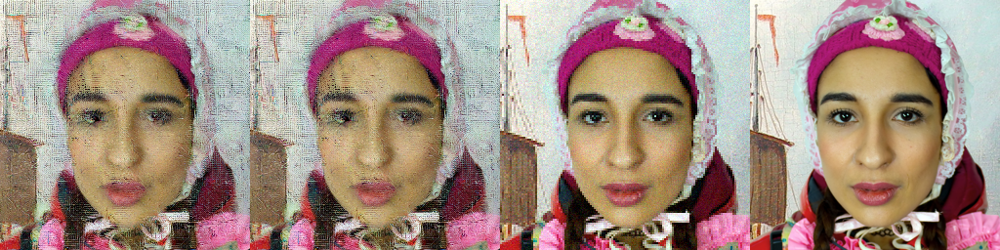

19.341699361801147


In [ ]:
import time
time1=time.time()
ddpm.posterior_sampling(linear_operator, y, x_true=x_true, show_steps=True)
time2=time.time()-time1
print(time2)

In [ ]:
from torch.nn.functional import interpolate

def linear_operator(x, scale_pct = 0.5):
  x = interpolate(x, scale_factor=(scale_pct, scale_pct))
  x = interpolate(x, scale_factor=(1/scale_pct, 1/scale_pct))
  return x

In [ ]:
y = linear_operator(x_true.clone()) + sigma_noise * torch.randn_like(x_true)

  0%|          | 0/599 [00:00<?, ?it/s]

Iteration : 500


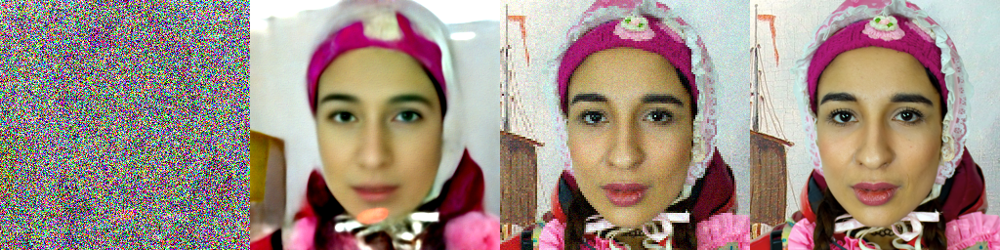

Iteration : 400


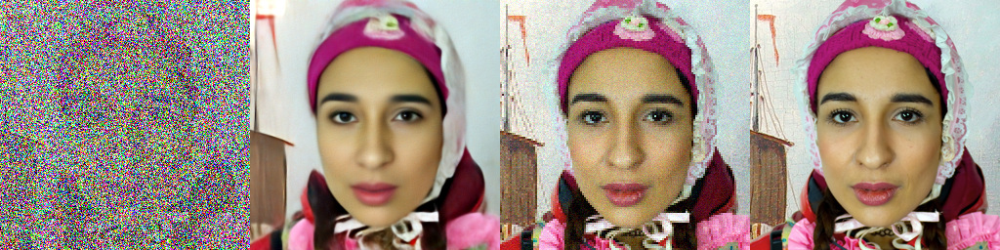

Iteration : 300


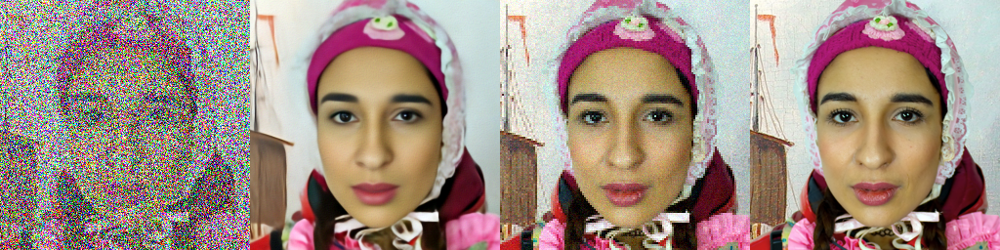

Iteration : 200


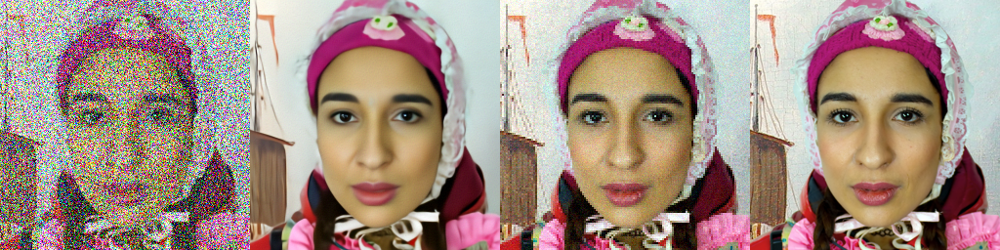

Iteration : 100


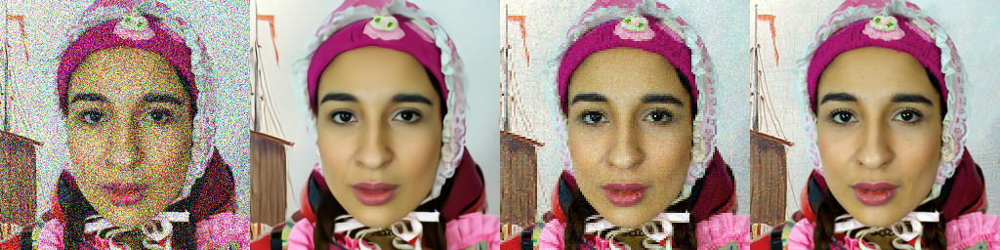

Iteration : 0


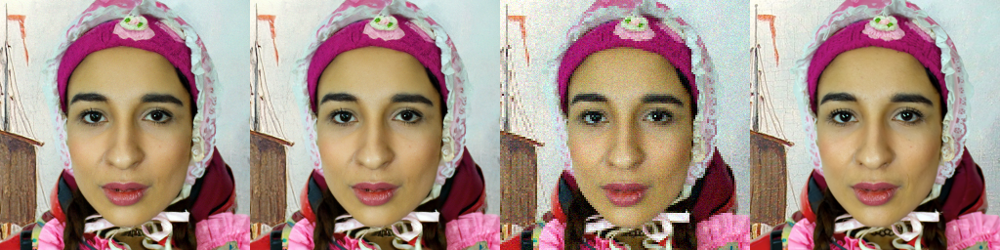

tensor([[[[ 0.9804,  0.9539,  0.9716,  ...,  0.5219,  0.4808,  0.4889],
          [ 0.9758,  0.9746,  0.9785,  ...,  0.5355,  0.4892,  0.5054],
          [ 0.9802,  0.9586,  0.9828,  ...,  0.5142,  0.5311,  0.4889],
          ...,
          [ 0.4787,  0.4636,  0.4920,  ...,  0.9700,  0.9363,  0.9593],
          [ 0.4710,  0.4827,  0.4941,  ...,  0.9848,  0.9711,  0.9855],
          [ 0.4536,  0.5059,  0.4718,  ...,  0.9698,  0.9688,  0.9890]],

         [[ 0.9505,  0.9702,  0.9776,  ...,  0.7100,  0.6834,  0.6836],
          [ 0.9692,  0.9812,  0.9759,  ...,  0.7172,  0.7089,  0.7133],
          [ 0.9529,  0.9484,  0.9888,  ...,  0.7057,  0.7152,  0.6946],
          ...,
          [-0.7702, -0.7986, -0.7833,  ...,  0.2451,  0.2773,  0.3394],
          [-0.7772, -0.7791, -0.7786,  ...,  0.2294,  0.2931,  0.3022],
          [-0.7741, -0.7837, -0.7590,  ...,  0.2291,  0.2589,  0.2619]],

         [[ 0.9009,  0.8621,  0.8543,  ...,  0.7005,  0.6701,  0.6703],
          [ 0.8686,  0.8672,  

In [ ]:
ddpm.posterior_sampling(linear_operator, y, x_true=x_true, show_steps=True)

In [ ]:
import shutil
shutil.make_archive('inpainting_ddpm', 'zip', 'inpainting_ddpm')

'/content/inpainting_ddpm.zip'